In [89]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from pathlib import Path

In [90]:
def compute_color_histogram(image, bin_size= 8):
    hist = cv2.calcHist([image], [0, 1, 2], None, [bin_size]*3, [0, 256]*3)
    hist = cv2.normalize(hist, hist).flatten()
    return hist

In [91]:
def show_image(image, title, figsize= (10, 10)):
    plt.figure(figsize=figsize)
    plt.title(title)
    plt.imshow(image)
    plt.axis("off")
    plt.show()

In [92]:
def rgb(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [93]:
dataset_dir = "./panorama_dataset"
clusters_dir = "clustered_images"
num_clusters = 3

image_paths = []
for image_path in os.listdir(dataset_dir):
    image_path = os.path.join(dataset_dir, image_path)
    image_paths.append(image_path)

features = []
for image_path in image_paths:
    image = cv2.imread(image_path)
    image_feature = compute_color_histogram(image)
    features.append(image_feature)

kmeans = KMeans(n_clusters=num_clusters, random_state=2022028)
labels = kmeans.fit_predict(features)
os.makedirs(clusters_dir, exist_ok=True)

for i in range(num_clusters):
    cluster_i = os.path.join(clusters_dir, f"cluster_{i}")
    os.makedirs(cluster_i, exist_ok=True)
    for image_path, label in zip(image_paths, labels):
        if label == i:
            clustered_image_path = os.path.join(cluster_i, image_path.split('\\')[-1])
            cv2.imwrite(clustered_image_path, cv2.imread(image_path))

print(f"Images saved into '{clusters_dir}'.")


Images saved into 'clustered_images'.


In [94]:
def get_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

def visualize_features(image, kp):
    image_with_keypoints = cv2.drawKeypoints(image, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)   
    show_image(rgb(image_with_keypoints), "SIFT Keypoints")

Number of keypoints detected: 5890
Descriptor shape: (5890, 128)


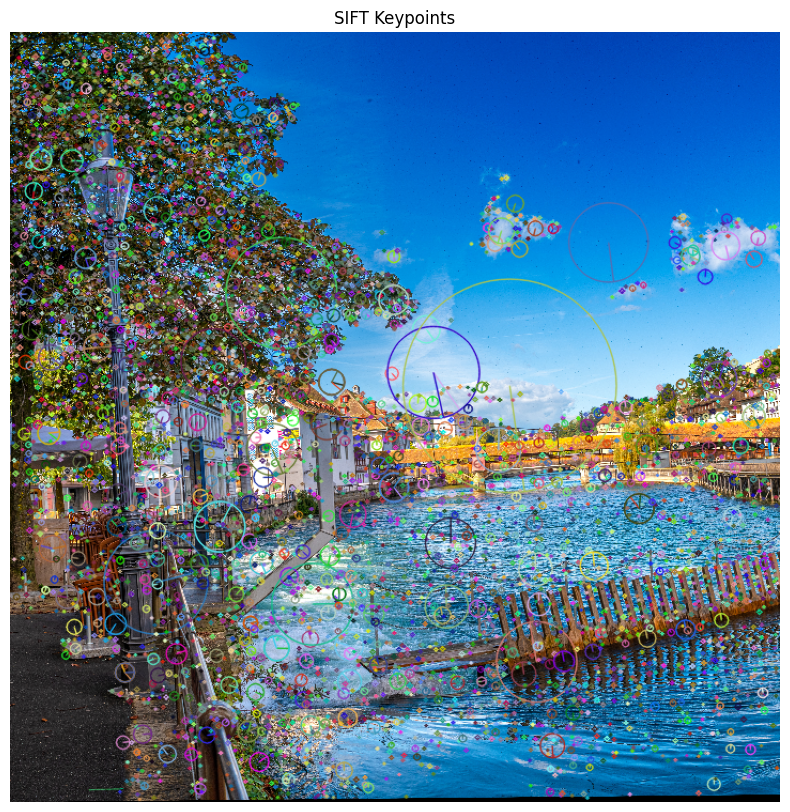

Number of keypoints detected: 4510
Descriptor shape: (4510, 128)


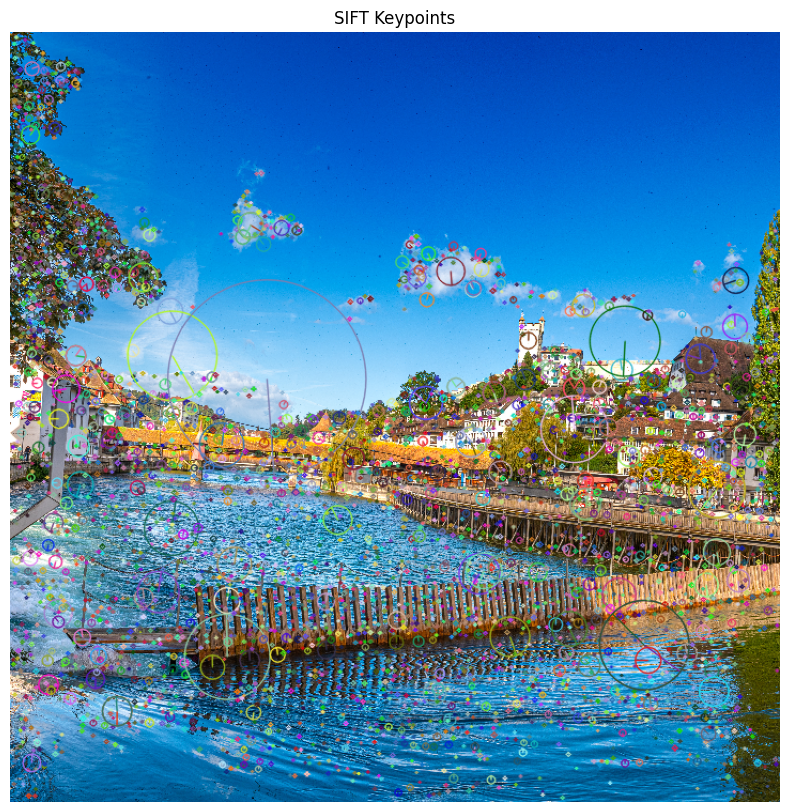

In [95]:
image1 = cv2.imread(os.path.join(dataset_dir, 'image1.png'))
keypoints_1, descriptors_1 = get_features(image1)
print(f"Number of keypoints detected: {len(keypoints_1)}")
print(f"Descriptor shape: {descriptors_1.shape}")
visualize_features(image1, kp=keypoints_1)

image2 = cv2.imread(os.path.join(dataset_dir, 'image2.png'))
keypoints_2, descriptors_2 = get_features(image2)
print(f"Number of keypoints detected: {len(keypoints_2)}")
print(f"Descriptor shape: {descriptors_2.shape}")
visualize_features(image2, kp=keypoints_2)

In [96]:
# --- Lowe's Ratio Test ---
def ratio_test(matches, t=0.75):
    good_matches = []
    for m, n in matches:
        if m.distance < t * n.distance:
            good_matches.append(m)
    return good_matches

In [97]:
def draw_matches(image1, kp1, image2, kp2, matches, title):
    matched_image = cv2.drawMatches(image1, kp1, image2, kp2, matches, None, 
                                    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        
    show_image(rgb(matched_image), title, figsize=(15,8))

In [98]:
def get_bruteforce(desc1, desc2):
    bf = cv2.BFMatcher()
    matches_bf = bf.knnMatch(desc1, desc2, k=2)
    good_bf = ratio_test(matches_bf)
    return good_bf

In [99]:
def get_flann(desc1, desc2, FLANN_INDEX_KDTREE=1):
    
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches_flann = flann.knnMatch(desc1, desc2, k=2)
    good_flann = ratio_test(matches_flann, t=0.7)
    return good_flann

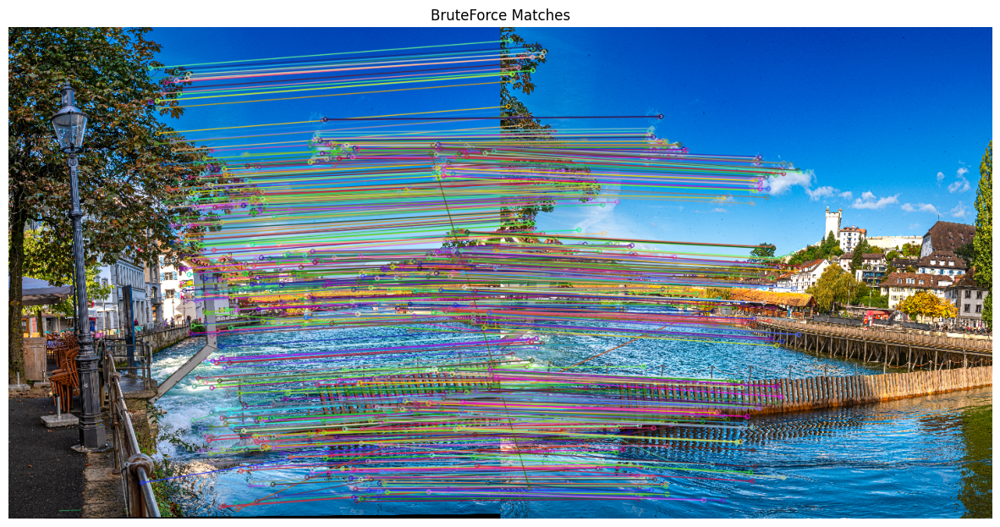

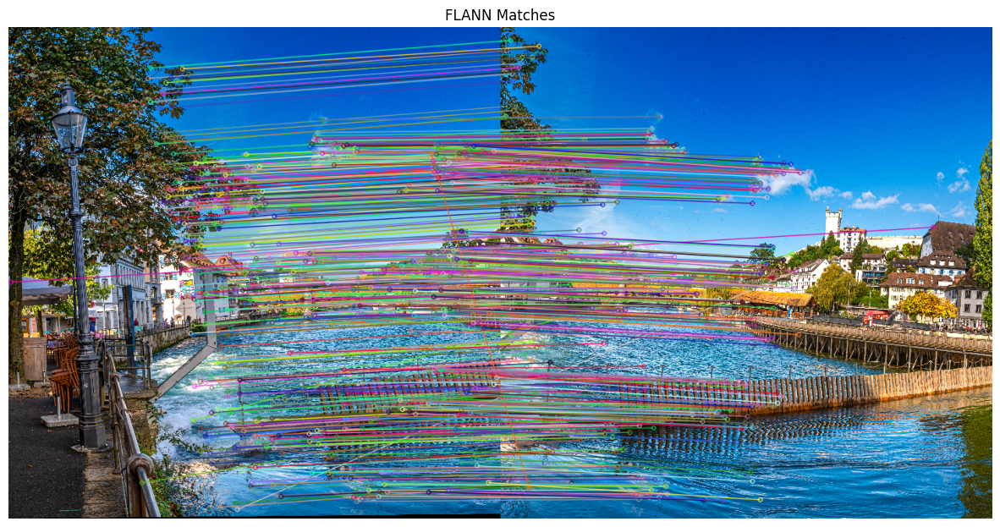

In [100]:
matches_bruteforce = get_bruteforce(desc1=descriptors_1, desc2=descriptors_2)
matches_flann = get_flann(desc1=descriptors_1, desc2=descriptors_2)

draw_matches(image1, keypoints_1, image2, keypoints_2, matches_bruteforce, "BruteForce Matches")
draw_matches(image1, keypoints_1, image2, keypoints_2, matches_flann, "FLANN Matches")

In [101]:
def get_homography(kp1, kp2, matches_flann):
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches_flann]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches_flann]).reshape(-1, 1, 2)
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 3.0)
    return M

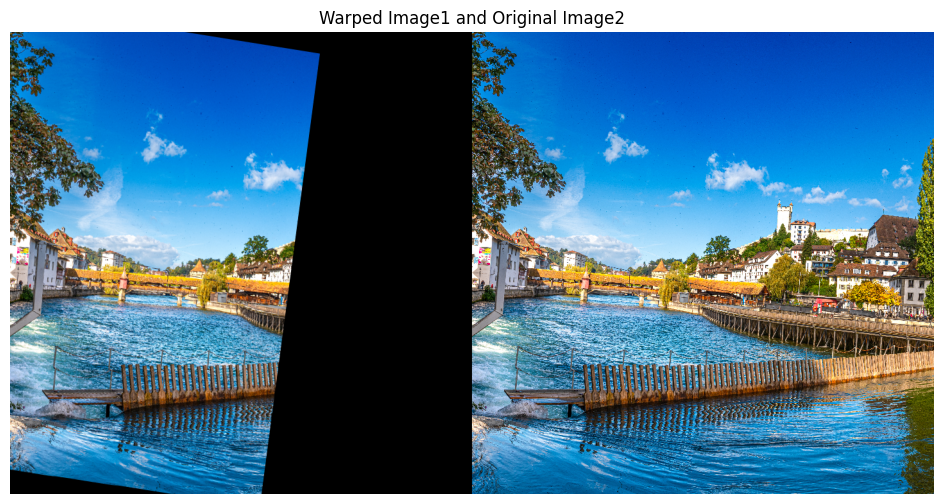

In [102]:
h1, w1 = image1.shape[:2]
h2, w2 = image2.shape[:2]

M = get_homography(keypoints_1, keypoints_2, matches_flann)
pd.DataFrame(M).to_csv("homography.csv", index=False, header=False)
warped_img1 = cv2.warpPerspective(image1, M, (w2, h2))
combined_image = rgb(np.hstack((warped_img1, image2)))
show_image(combined_image, 'Warped Image1 and Original Image2', figsize=(12, 6))

In [103]:
def stitch(image1, image2, M):
    h1, w1 = image1.shape[:2]
    h2, w2 = image2.shape[:2]
    corners_image1 = np.float32([[[0, 0]], [[0, h1]], [[w1, h1]], [[w1, 0]]])
    corners_image2 = np.float32([[[0, 0]], [[0, h2]], [[w2, h2]], [[w2, 0]]])
    warped_corners = cv2.perspectiveTransform(corners_image1, M)
    all_corners = np.concatenate((warped_corners, corners_image2), axis=0)

    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel())
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel())

    translate_matrix = np.array([[1, 0, -x_min],
                                [0, 1, -y_min],
                                [0, 0, 1]])

    # Step 2: Warp img1 to new canvas
    result = cv2.warpPerspective(image1, np.dot(translate_matrix, M), (x_max - x_min, y_max - y_min))
    result[-y_min:-y_min + h2, -x_min:-x_min + w2] = image2
    return result

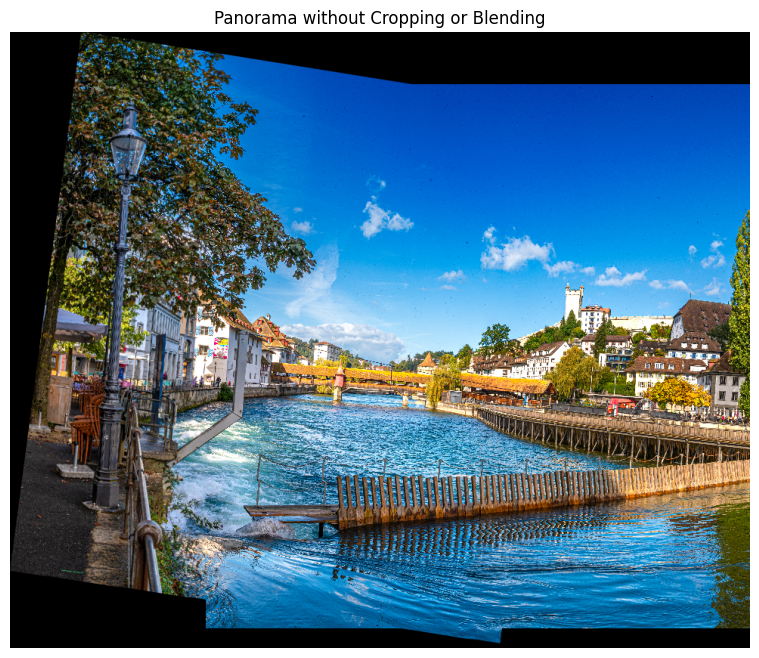

In [104]:
stitched_image = stitch(image1, image2, M) 
show_image(rgb(stitched_image), "Panorama without Cropping or Blending", figsize=(16, 8))

In [105]:
def crop(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return image

    x, y, w, h = cv2.boundingRect(contours[0])
    return image[y:y+h, x:x+w]

In [106]:
def create_panorama(cluster_idx):
    image_paths = []
    base= os.path.join(clusters_dir, cluster_idx)
    for image_path in os.listdir(base):
        image_path = os.path.join(base, image_path)
        image_paths.append(image_path)

    images = [cv2.imread(img_path) for img_path in image_paths]
    stitched_image = images.pop(0)

    while len(images) > 0:
        best_match_idx = None
        best_match_count = 0
        best_M = None

        for idx, candidate_image in enumerate(images):
            kp1, desc1 = get_features(stitched_image)
            kp2, desc2 = get_features(candidate_image)
            matches = get_flann(desc1, desc2)

            if len(matches) > best_match_count:
                best_match_count = len(matches)
                best_match_idx = idx
                try:
                    best_M = get_homography(kp1, kp2, matches)
                except cv2.error as e:
                    continue

        best_match_image = images.pop(best_match_idx)
        stitched_image = stitch(stitched_image, best_match_image, best_M)

    # stitched_image = crop(stitched_image)
    return stitched_image

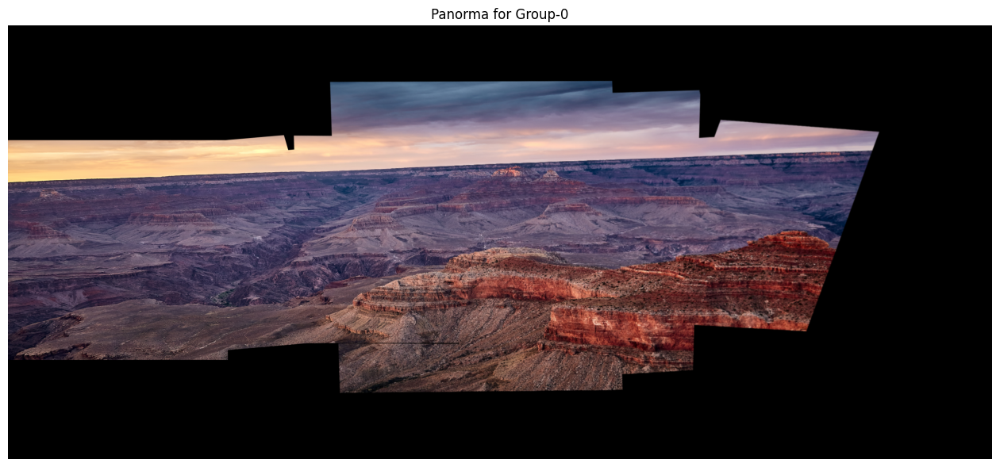

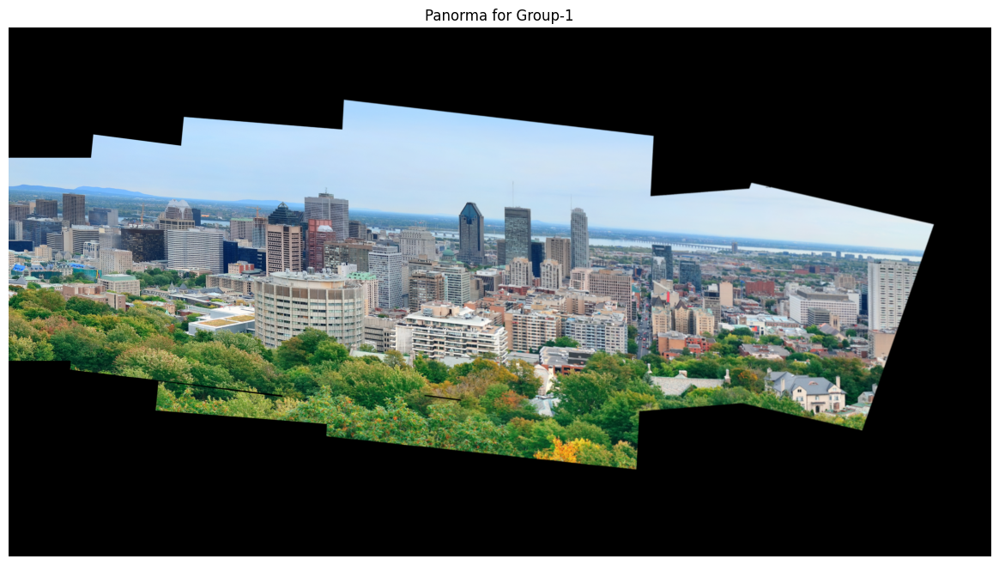

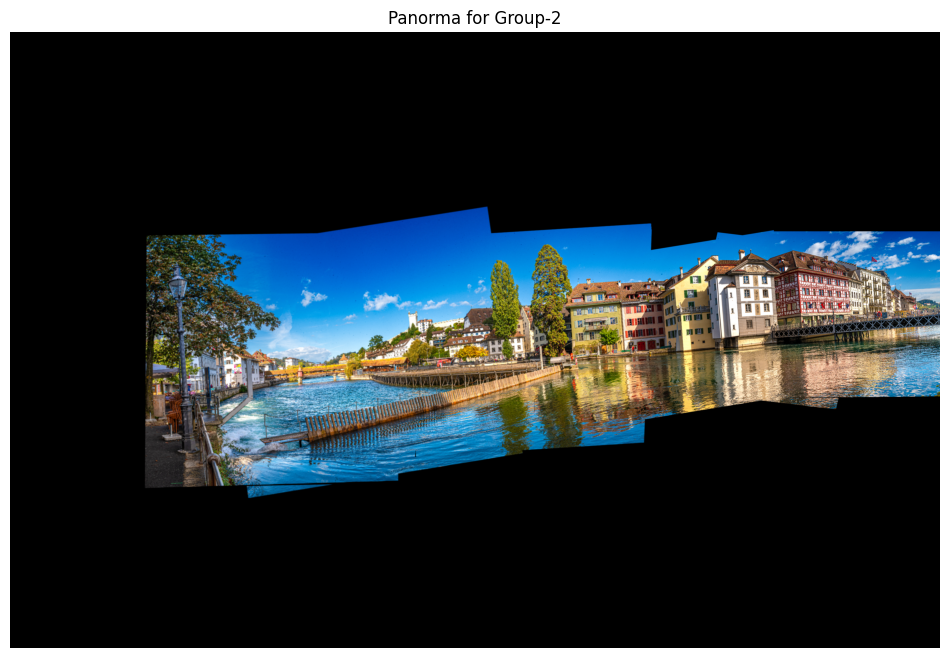

In [ ]:
for idx in range(3):
    panorama = create_panorama(f'cluster_{idx}')
    show_image(rgb(panorama), f"Panorma for Group-{idx}", figsize=(16,8))
    os.makedirs("./output", exist_ok=True)
    output_path = os.path.join("./output", f"Panorama_{idx}.png")
    cv2.imwrite(output_path, panorama)
print(f"Stitched Panorama Images saved in directory 'output'")